In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [2]:
os.chdir('/Users/Erin/git/accre_data_analysis/uniform_priors_.25his/')

In [3]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = [np.load('earm_dreamz_12chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 12):
        traces[trace].append(np.load('earm_dreamz_12chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [4]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = [np.load('earm_dreamz_12chain_uniform_.25his_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 12):
        logps[trace].append(np.load('earm_dreamz_12chain_uniform_.25his_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-1564.81129394]
 [-1497.69216827]
 [-1497.69216827]
 ..., 
 [  103.86533551]
 [  103.86533551]
 [  103.86533551]]
Logp of trace:  a  chain:  1  =  [ 107.36798463]
Logp of trace:  a  chain:  2  =  [ 105.00881362]
Logp of trace:  a  chain:  3  =  [ 104.96265926]
Logp of trace:  a  chain:  4  =  [ 107.91184515]
Logp of trace:  a  chain:  5  =  [ 101.72267077]
Logp of trace:  a  chain:  6  =  [ 106.89798328]
Logp of trace:  a  chain:  7  =  [ 96.69152891]
Logp of trace:  a  chain:  8  =  [ 106.51402505]
Logp of trace:  a  chain:  9  =  [ 104.62205999]
Logp of trace:  a  chain:  10  =  [ 104.89632728]
Logp of trace:  a  chain:  11  =  [ 104.26028141]
Logp of trace:  b  chain: 0 =  [[-2202.76279217]
 [ -693.31363813]
 [ -620.59586803]
 ..., 
 [  105.37829896]
 [  105.37829896]
 [  105.37829896]]
Logp of trace:  b  chain:  1  =  [ 105.62764227]
Logp of trace:  b  chain:  2  =  [ 103.98751146]
Logp of trace:  b  chain:  3  =  [ 99.49703782]
Logp of trace:  b  c

In [5]:
traces['a'][0][:,72]

array([-1.16808181, -1.15431444, -1.15431444, ...,  1.22814987,
        1.22814987,  1.22814987])

In [6]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b', 'c', 'd']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [7]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  40  of  105  parameters.
Percent of parameters with GR below 1.2:  38.0952380952
Number of parameters with GR below 1.1:  4  of  105  parameters.
Percent of parameters with GR below 1.1:  3.80952380952


[40, 38.095238095238095, 4, 3.8095238095238098]

In [8]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  19  of  105  parameters.
Percent of parameters with GR below 1.2:  18.0952380952
Number of parameters with GR below 1.1:  1  of  105  parameters.
Percent of parameters with GR below 1.1:  0.952380952381


[19, 18.095238095238095, 1, 0.9523809523809524]

In [9]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  26  of  105  parameters.
Percent of parameters with GR below 1.2:  24.7619047619
Number of parameters with GR below 1.1:  5  of  105  parameters.
Percent of parameters with GR below 1.1:  4.7619047619


[26, 24.761904761904763, 5, 4.761904761904762]

In [10]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  19  of  105  parameters.
Percent of parameters with GR below 1.2:  18.0952380952
Number of parameters with GR below 1.1:  1  of  105  parameters.
Percent of parameters with GR below 1.1:  0.952380952381


[19, 18.095238095238095, 1, 0.9523809523809524]

50000
12
50000


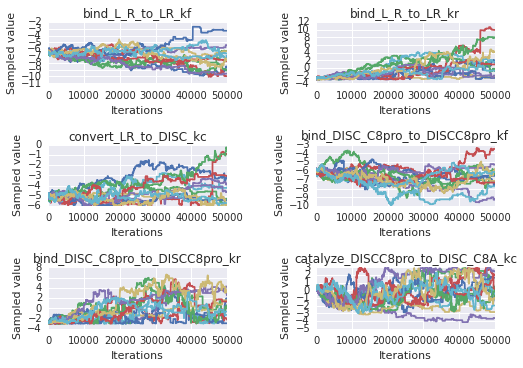

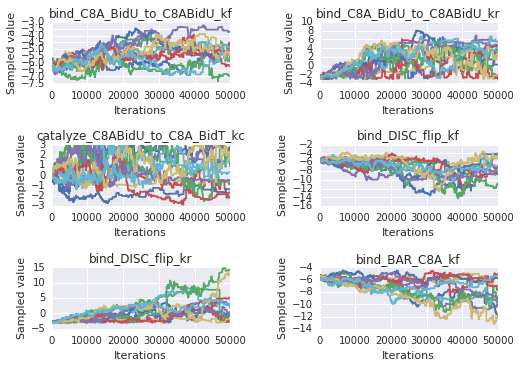

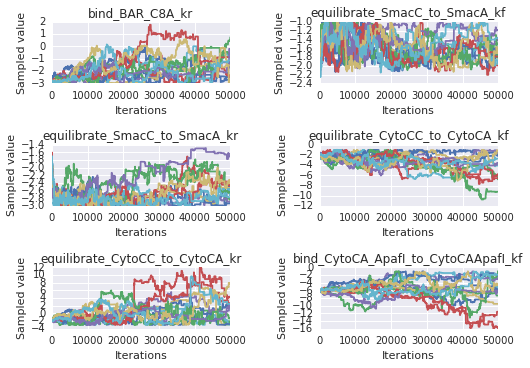

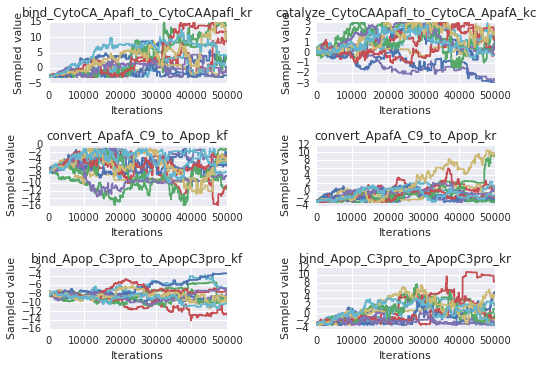

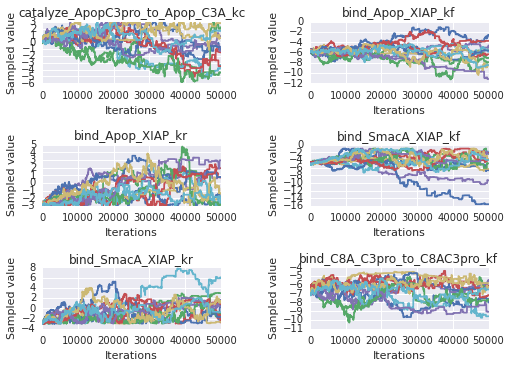

...

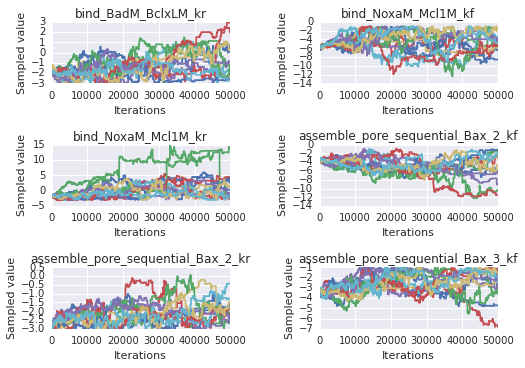

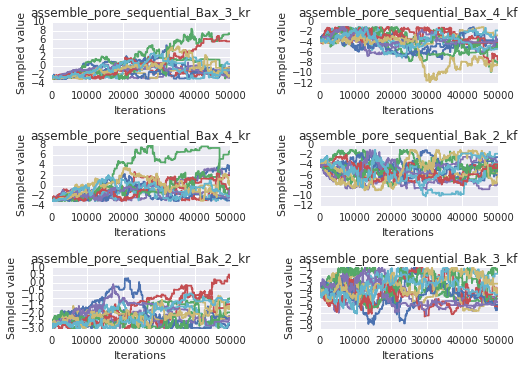

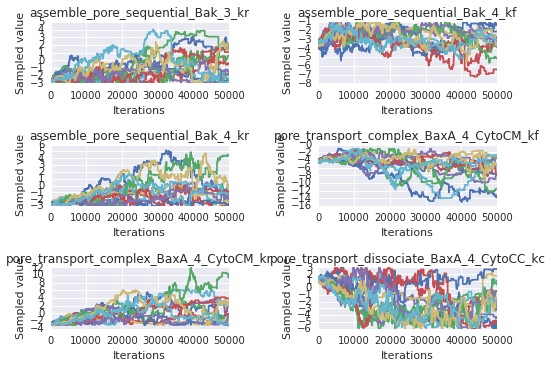

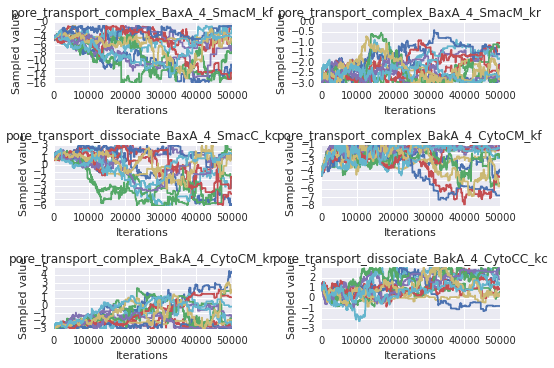

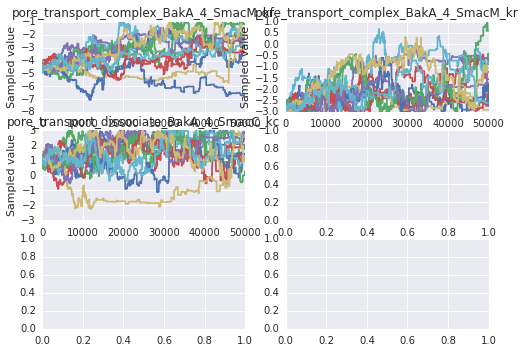

In [11]:
sample_plots(param_trace_dicts['a'])

In [12]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=40000, thin=1)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=40000, thin=1)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=40000, thin=1)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=40000, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


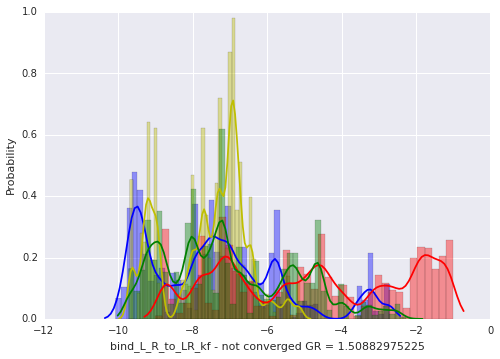

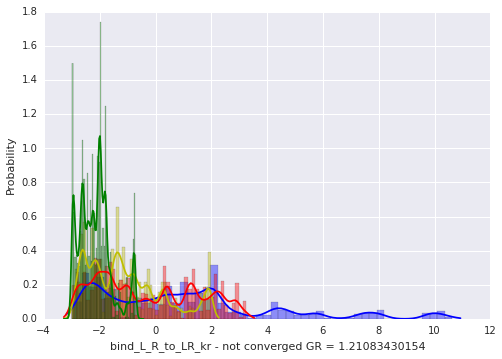

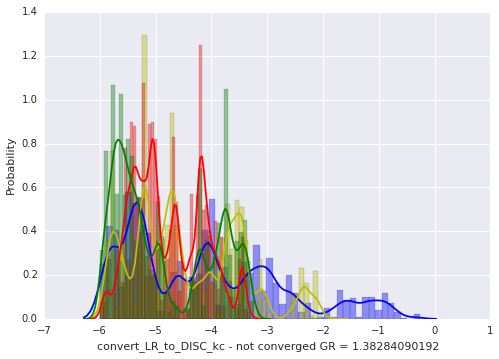

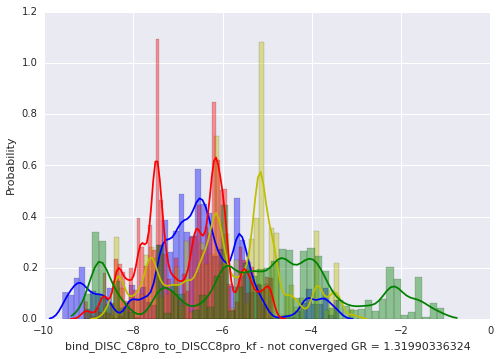

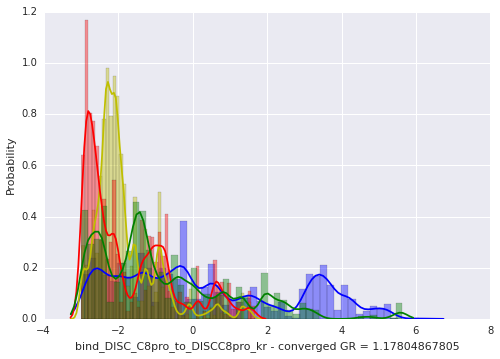

...

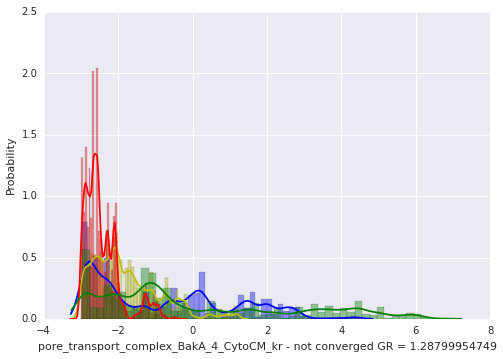

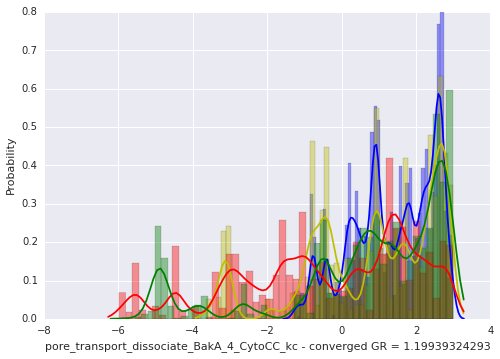

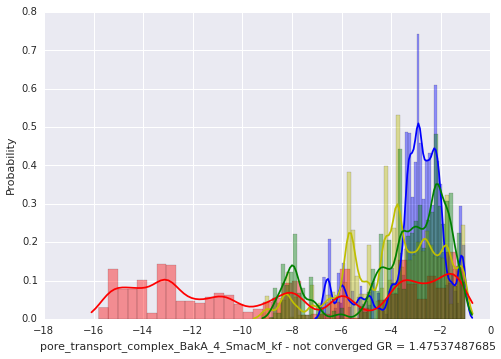

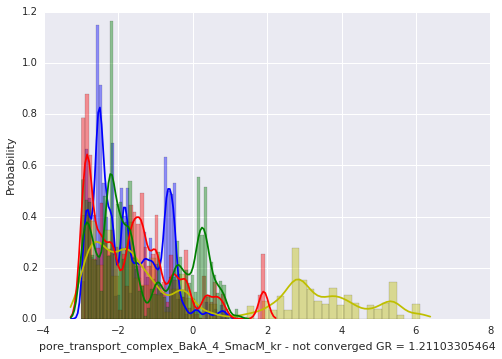

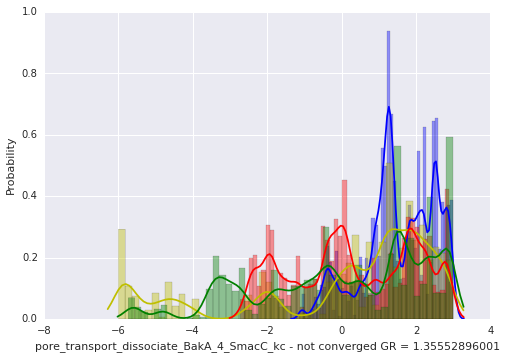

In [13]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    sns.distplot(trace_arr_b[:,dim], hist=True, color='y')
    sns.distplot(trace_arr_c[:,dim], hist=True, color='r')
    sns.distplot(trace_arr_d[:,dim], hist=True, color='g')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

In [14]:
traces['a'][1][:,0]

array([-6.35903831, -6.35903831, -6.35903831, ..., -6.22848983,
       -6.22848983, -6.22848983])

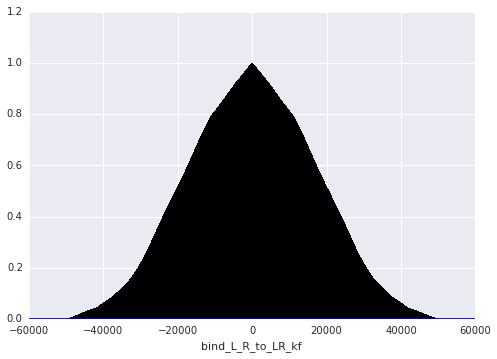

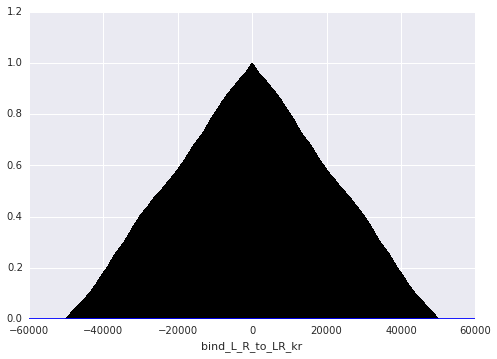

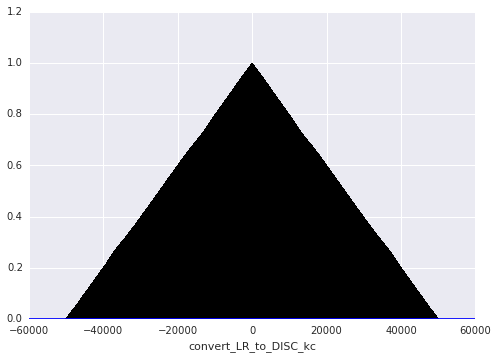

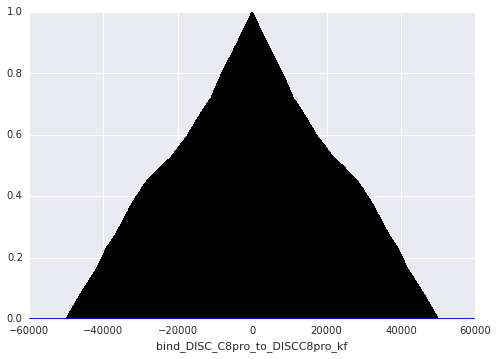

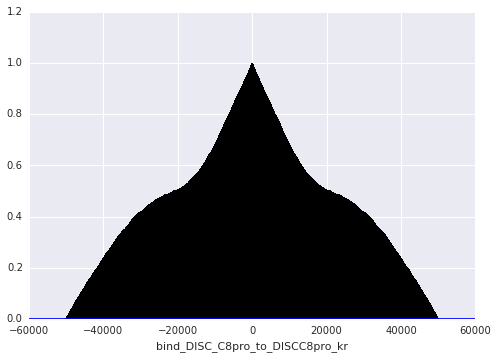

...

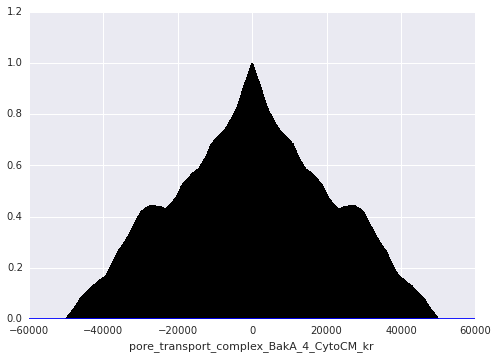

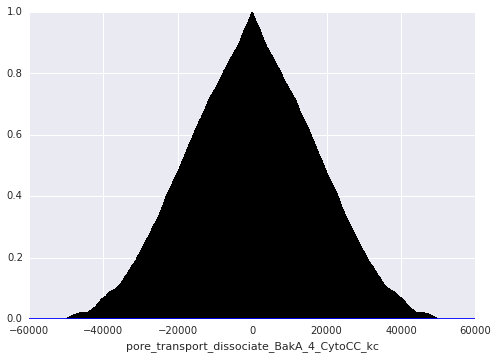

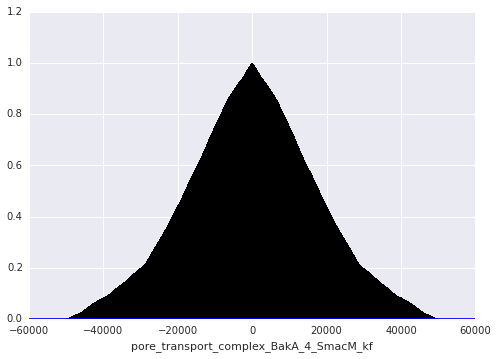

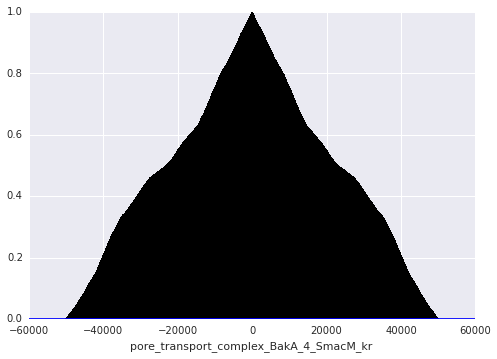

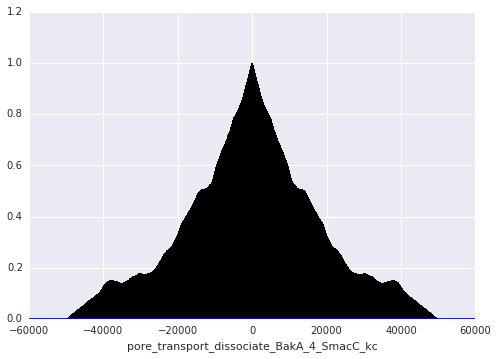

In [ ]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][1][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][2][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [15]:
acceptance_rates = np.zeros((len(traces['a'][0][0],)))
for dim in range(len(traces['a'][0][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][0])):
        if traces['a'][0][iteration][dim] != traces['a'][0][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  662  acceptance rate:  0.01324
N acceptances for parameter:  bind_L_R_to_LR_kr  =  709  acceptance rate:  0.01418
N acceptances for parameter:  convert_LR_to_DISC_kc  =  682  acceptance rate:  0.01364
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  640  acceptance rate:  0.0128
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  728  acceptance rate:  0.01456
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  707  acceptance rate:  0.01414
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  658  acceptance rate:  0.01316
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  698  acceptance rate:  0.01396
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  731  acceptance rate:  0.01462
N acceptances for parameter:  bind_DISC_flip_kf  =  707  acceptance rate:  0.01414
N acceptances for parameter:  bind_DISC_flip_kr  =  705  acceptance rate:  0.0141
N accep

array([ 0.01324,  0.01418,  0.01364,  0.0128 ,  0.01456,  0.01414,
        0.01316,  0.01396,  0.01462,  0.01414,  0.0141 ,  0.01378,
        0.01434,  0.01418,  0.01394,  0.01402,  0.01406,  0.01404,
        0.01408,  0.01412,  0.01438,  0.01412,  0.01384,  0.01412,
        0.01418,  0.01366,  0.01392,  0.01442,  0.01442,  0.01328,
        0.01396,  0.01422,  0.01352,  0.01414,  0.0142 ,  0.01396,
        0.01402,  0.01446,  0.01344,  0.01446,  0.0144 ,  0.01408,
        0.01414,  0.01364,  0.01434,  0.01428,  0.01402,  0.01466,
        0.01418,  0.0141 ,  0.01424,  0.01418,  0.01392,  0.01406,
        0.01404,  0.0143 ,  0.01432,  0.01418,  0.0144 ,  0.01392,
        0.01418,  0.01428,  0.01416,  0.0146 ,  0.01404,  0.01372,
        0.01414,  0.01446,  0.01416,  0.0142 ,  0.01436,  0.01456,
        0.01444,  0.01392,  0.01396,  0.01446,  0.01412,  0.01472,
        0.0144 ,  0.0143 ,  0.01422,  0.01418,  0.01426,  0.0142 ,
        0.01442,  0.01422,  0.01384,  0.0143 ,  0.01426,  0.01

In [16]:
acceptance_rates = np.zeros((len(traces['a'][1][0],)))
for dim in range(len(traces['a'][1][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][1])):
        if traces['a'][1][iteration][dim] != traces['a'][1][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][1])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  514  acceptance rate:  0.01028
N acceptances for parameter:  bind_L_R_to_LR_kr  =  571  acceptance rate:  0.01142
N acceptances for parameter:  convert_LR_to_DISC_kc  =  528  acceptance rate:  0.01056
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  548  acceptance rate:  0.01096
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  574  acceptance rate:  0.01148
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  544  acceptance rate:  0.01088
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  548  acceptance rate:  0.01096
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  570  acceptance rate:  0.0114
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  549  acceptance rate:  0.01098
N acceptances for parameter:  bind_DISC_flip_kf  =  571  acceptance rate:  0.01142
N acceptances for parameter:  bind_DISC_flip_kr  =  586  acceptance rate:  0.01172
N acce

array([ 0.01028,  0.01142,  0.01056,  0.01096,  0.01148,  0.01088,
        0.01096,  0.0114 ,  0.01098,  0.01142,  0.01172,  0.01144,
        0.01164,  0.0114 ,  0.01164,  0.0112 ,  0.01186,  0.01186,
        0.01148,  0.01122,  0.01124,  0.01132,  0.01168,  0.01142,
        0.01176,  0.0117 ,  0.01148,  0.01138,  0.01126,  0.01092,
        0.0113 ,  0.01134,  0.01162,  0.0113 ,  0.01168,  0.0116 ,
        0.01158,  0.01162,  0.01098,  0.01142,  0.01106,  0.0111 ,
        0.01126,  0.01088,  0.01148,  0.01128,  0.01118,  0.0113 ,
        0.01148,  0.01158,  0.0117 ,  0.01124,  0.0112 ,  0.01182,
        0.0113 ,  0.01146,  0.01162,  0.01142,  0.01144,  0.01138,
        0.0119 ,  0.01154,  0.01144,  0.01162,  0.01162,  0.01136,
        0.01138,  0.01156,  0.01126,  0.0114 ,  0.01148,  0.01136,
        0.01154,  0.01154,  0.0113 ,  0.01156,  0.01152,  0.01172,
        0.0118 ,  0.01162,  0.01176,  0.01154,  0.01124,  0.01134,
        0.01124,  0.0119 ,  0.01094,  0.01128,  0.01148,  0.01

In [17]:
acceptance_rates = np.zeros((len(traces['a'][2][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][2])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  660  acceptance rate:  0.0132
N acceptances for parameter:  bind_L_R_to_LR_kr  =  673  acceptance rate:  0.01346
N acceptances for parameter:  convert_LR_to_DISC_kc  =  640  acceptance rate:  0.0128
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  637  acceptance rate:  0.01274
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  670  acceptance rate:  0.0134
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  670  acceptance rate:  0.0134
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  630  acceptance rate:  0.0126
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  672  acceptance rate:  0.01344
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  644  acceptance rate:  0.01288
N acceptances for parameter:  bind_DISC_flip_kf  =  658  acceptance rate:  0.01316
N acceptances for parameter:  bind_DISC_flip_kr  =  651  acceptance rate:  0.01302
N acceptan

array([ 0.0132 ,  0.01346,  0.0128 ,  0.01274,  0.0134 ,  0.0134 ,
        0.0126 ,  0.01344,  0.01288,  0.01316,  0.01302,  0.01308,
        0.01296,  0.0134 ,  0.01318,  0.01332,  0.01302,  0.01312,
        0.0132 ,  0.0134 ,  0.01296,  0.01388,  0.01316,  0.0135 ,
        0.01288,  0.01332,  0.01312,  0.0133 ,  0.01342,  0.01278,
        0.01334,  0.01322,  0.01246,  0.01312,  0.01328,  0.0131 ,
        0.01302,  0.01328,  0.0129 ,  0.01286,  0.01314,  0.01308,
        0.01334,  0.01328,  0.01336,  0.01346,  0.01278,  0.01306,
        0.01296,  0.01308,  0.0134 ,  0.01288,  0.01352,  0.01356,
        0.01346,  0.01334,  0.01316,  0.01322,  0.01326,  0.0133 ,
        0.01316,  0.01328,  0.01366,  0.0133 ,  0.01316,  0.0134 ,
        0.01336,  0.01306,  0.01334,  0.01316,  0.01346,  0.01308,
        0.01308,  0.01322,  0.01362,  0.0135 ,  0.0131 ,  0.01336,
        0.01348,  0.0133 ,  0.01312,  0.0134 ,  0.01328,  0.01298,
        0.01296,  0.0135 ,  0.01324,  0.01314,  0.01348,  0.01

In [18]:
acceptance_rates = np.zeros((len(traces['b'][3][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['b'][0])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['b'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  660  acceptance rate:  0.0132
N acceptances for parameter:  bind_L_R_to_LR_kr  =  673  acceptance rate:  0.01346
N acceptances for parameter:  convert_LR_to_DISC_kc  =  640  acceptance rate:  0.0128
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  637  acceptance rate:  0.01274
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  670  acceptance rate:  0.0134
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  670  acceptance rate:  0.0134
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  630  acceptance rate:  0.0126
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  672  acceptance rate:  0.01344
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  644  acceptance rate:  0.01288
N acceptances for parameter:  bind_DISC_flip_kf  =  658  acceptance rate:  0.01316
N acceptances for parameter:  bind_DISC_flip_kr  =  651  acceptance rate:  0.01302
N acceptan

array([ 0.0132 ,  0.01346,  0.0128 ,  0.01274,  0.0134 ,  0.0134 ,
        0.0126 ,  0.01344,  0.01288,  0.01316,  0.01302,  0.01308,
        0.01296,  0.0134 ,  0.01318,  0.01332,  0.01302,  0.01312,
        0.0132 ,  0.0134 ,  0.01296,  0.01388,  0.01316,  0.0135 ,
        0.01288,  0.01332,  0.01312,  0.0133 ,  0.01342,  0.01278,
        0.01334,  0.01322,  0.01246,  0.01312,  0.01328,  0.0131 ,
        0.01302,  0.01328,  0.0129 ,  0.01286,  0.01314,  0.01308,
        0.01334,  0.01328,  0.01336,  0.01346,  0.01278,  0.01306,
        0.01296,  0.01308,  0.0134 ,  0.01288,  0.01352,  0.01356,
        0.01346,  0.01334,  0.01316,  0.01322,  0.01326,  0.0133 ,
        0.01316,  0.01328,  0.01366,  0.0133 ,  0.01316,  0.0134 ,
        0.01336,  0.01306,  0.01334,  0.01316,  0.01346,  0.01308,
        0.01308,  0.01322,  0.01362,  0.0135 ,  0.0131 ,  0.01336,
        0.01348,  0.0133 ,  0.01312,  0.0134 ,  0.01328,  0.01298,
        0.01296,  0.0135 ,  0.01324,  0.01314,  0.01348,  0.01

In [19]:
acceptance_rates = np.zeros((len(traces['b'][4][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['b'][0])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['b'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  660  acceptance rate:  0.0132
N acceptances for parameter:  bind_L_R_to_LR_kr  =  673  acceptance rate:  0.01346
N acceptances for parameter:  convert_LR_to_DISC_kc  =  640  acceptance rate:  0.0128
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  637  acceptance rate:  0.01274
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  670  acceptance rate:  0.0134
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  670  acceptance rate:  0.0134
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  630  acceptance rate:  0.0126
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  672  acceptance rate:  0.01344
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  644  acceptance rate:  0.01288
N acceptances for parameter:  bind_DISC_flip_kf  =  658  acceptance rate:  0.01316
N acceptances for parameter:  bind_DISC_flip_kr  =  651  acceptance rate:  0.01302
N acceptan

array([ 0.0132 ,  0.01346,  0.0128 ,  0.01274,  0.0134 ,  0.0134 ,
        0.0126 ,  0.01344,  0.01288,  0.01316,  0.01302,  0.01308,
        0.01296,  0.0134 ,  0.01318,  0.01332,  0.01302,  0.01312,
        0.0132 ,  0.0134 ,  0.01296,  0.01388,  0.01316,  0.0135 ,
        0.01288,  0.01332,  0.01312,  0.0133 ,  0.01342,  0.01278,
        0.01334,  0.01322,  0.01246,  0.01312,  0.01328,  0.0131 ,
        0.01302,  0.01328,  0.0129 ,  0.01286,  0.01314,  0.01308,
        0.01334,  0.01328,  0.01336,  0.01346,  0.01278,  0.01306,
        0.01296,  0.01308,  0.0134 ,  0.01288,  0.01352,  0.01356,
        0.01346,  0.01334,  0.01316,  0.01322,  0.01326,  0.0133 ,
        0.01316,  0.01328,  0.01366,  0.0133 ,  0.01316,  0.0134 ,
        0.01336,  0.01306,  0.01334,  0.01316,  0.01346,  0.01308,
        0.01308,  0.01322,  0.01362,  0.0135 ,  0.0131 ,  0.01336,
        0.01348,  0.0133 ,  0.01312,  0.0134 ,  0.01328,  0.01298,
        0.01296,  0.0135 ,  0.01324,  0.01314,  0.01348,  0.01